# Project Title: Customer Analysis Based On Olist E-Commerce Data

# Team Members

Xingjian Liu: liuxjum  
Hongxuan An: aanaa

# Overview

Olist is a Brazilian e-commerce platform that connects small and medium-sized businesses to customers across Brazil. The platform operates as a marketplace, where merchants can list their products and services and customers can browse and purchase them online. Olist has rich e-commerce operational data, providing details at each stage of e-commerce sales. 

The primary objective of our project is to conduct a comprehensive customer analysis for Olist. By diving deep into the behavioral patterns, transactional data, and overall engagement of customers, we aim to derive actionable insights that can drive personalized marketing strategies, enhance customer retention, and optimize resource allocation. The ultimate goal is to provide business intelligence that will empower the platform to not only meet but exceed customer expectations, thereby fostering a loyal customer base and driving sustainable growth.

# Motivation

The motivation behind choosing this particular topic stems from the recognition of customers as the lifeblood of any e-commerce platform. In today's highly competitive digital marketplace, understanding customer behavior and value is vital and paramount. We were particularly drawn to the challenge of unlocking the potential within customer data, mainly in three aspects:  
* Customer EDA: By exploring and understanding the underlying patterns in customer distributions and behaviors, we can provide a general overview of the Olist e-commerce data and uncover areas of improvement within the platform.
* Customer Segmentation: By segmenting customers into meaningful groups based on their transactional behavior, we can enable targeted marketing efforts and more efficient allocation of resources, improving personalized customer experience.
* Customer Lifetime Value (LTV) Prediction: Predicting LTV is crucial for decision-making about customer acquisition and retention strategies by focusing on customers who are most likely to contribute significantly to the platform’s profitability over time.  

To sum up, this project is driven by the desire to derive data-driven solutions that enable the e-commerce platform to not only survive but thrive in the competitive landscape. Through this analysis, we hope to contribute to the development of a more customer-centered platform that values and leverages the power of its customer data to drive decisions and strategies.


![Olist Problem Schema](images/olist_problem_schema.png)

# Data Sources

Kaggle: https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce  
The data was provided by Olist, containing multiple datasets that can be joined on certain keys. The schema is shown below:  
![Olist Dataset Schema](images/olist_dataset_schema.png)


# I. Data Description

## I.1. Import Packages

In [1]:
! pip3 install plotly
! pip3 install folium
! pip3 install wordcloud

In [2]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from matplotlib.gridspec import GridSpec
pd.set_option('display.max_columns', 100)

import plotly.offline as py
import plotly.express as px
import plotly.graph_objs as go

import json
import requests
import folium
from folium.plugins import FastMarkerCluster, Fullscreen, MiniMap, HeatMap, HeatMapWithTime, LocateControl
from wordcloud import WordCloud
from collections import Counter
from PIL import Image

In [3]:
orders = pd.read_csv('Dataset/olist_orders_dataset.csv')
payment = pd.read_csv('Dataset/olist_order_payments_dataset.csv')
customers = pd.read_csv('Dataset/olist_customers_dataset.csv')
geolocation = pd.read_csv('Dataset/olist_geolocation_dataset.csv')
products = pd.read_csv('Dataset/olist_products_dataset.csv')
sellers = pd.read_csv('Dataset/olist_sellers_dataset.csv')
items = pd.read_csv('Dataset/olist_order_items_dataset.csv')
category = pd.read_csv('Dataset/product_category_name_translation.csv')
reviews = pd.read_csv('Dataset/olist_order_reviews_dataset.csv')


In [4]:
datasets = [orders, payment, customers, geolocation, products, sellers, items, category, reviews]
names = ['orders', 'payment', 'customers', 'geolocation', 'products', 'sellers', 'items', 'category', 'reviews']

## I.2. List Variables

In [5]:
data_info = pd.DataFrame(columns=['dataset', 'column', 'dtype'])
for name in names:
    dataset = datasets[names.index(name)]
    for col in dataset.columns:
        data_info.loc[len(data_info)] = [name, col, dataset[col].dtype]
data_info

,dataset,column,dtype
0,orders,order_id,object
1,orders,customer_id,object
2,orders,order_status,object
3,orders,order_purchase_timestamp,object
4,orders,order_approved_at,object
5,orders,order_delivered_carrier_date,object
6,orders,order_delivered_customer_date,object
7,orders,order_estimated_delivery_date,object
8,payment,order_id,object
9,payment,payment_sequential,int64


**Table Description**:  
1. olist_order_customer_dataset  
   Olist Customers  
     > customerd_id => key to the orders dataset. Each order has a unique customerd_id  
     > customers_unique_id => unique identifier of a customer  
     > customers_zip_code_prefix => first five digits of customer zip code  
     > customer_city => customer city name  
     > customer_state => customer state  
2. olist_order_dataset  
   Olist Orders  
     > order_id => unique identifier of the order  
     > customer_id => key to the customer dataset. Each order has a unique customer_id  
     > order_status => reference to the order status (delivered, shipped, etc)  
     > order_purchase_timestamp => shows the purchase timestamp  
     > order_approved_at => shows the payments approval timestamp  
     > order_delivered_carrier_state => shows the order posting timestamp. When it was handled to the logistic partner  
     > order_delivered_customer_date => shows the actual order delivery date to the customer  
     > order_estimated_delivery_date => shows the estimated delivery date that was informed to customer at the purchase moment  
3. olist_order_reviews_dataset  
   Olist Order Review  
     > review_id => unique review identifier  
     > order_id => unique order identifier  
     > review_score => note ranging from 1 to 5 given by the customer on a satisfaction survey  
     > review_comment_title => comment title from the review left by the customer, in Portuguese  
     > review_comment_message => comment message from the review left by the customer, in Portuguese  
     > review_creation_date => shows the date in which the satisfaction survey was sent to the customer  
     > review_answer_timestamp => shows satisfaction survey answer timestamp  
4. olist_order_payments_dataset  
   Olist Order Payments  
     > order_id => unique identifier of an order  
     > payment_sequential => a customer may pay an order with more than one payment method. if he does so, a sequence will be created to accomodate all payments  
     > payment_type => method of payment chosen by the customer  
     > payment_installments => number of installments chosen by the customer  
     > payment_value => transaction value  
5. olist_order_items_dataset  
   Olist Order Items  
     > order_id => order unique identifier  
     > order_item_id => sequential number identifying number of items included in the same order  
     > product_id => product unique identifier  
     > seller_id => seller unique identifier  
     > shipping_limit_date => shows the seller shipping limit date for handling the order over to the logistics partner  
     > price => item price  
     > freight_value => item freight value (if an order has more than one item the freight value is splitted between items)  
6. olist_products_dataset  
   Olist Products  
     > product_id => unique product  identifier  
     > product_category_name => root category of product, in Portuguese  
     > product_name_lenght => number of characters extracted from the product name  
     > product_description_lenght => number of characters extracted from the product product_description_lenght  
     > product_photos_qty => number of product published product_photos_qty  
     > product_weight_g => product weight measured in grams  
     > product_length_cm => product length measured in centimeters  
     > product_height_cm => product height measured in centimeters  
     > product_width_cm => product width measured in centimeters  
7. olist_sellers_dataset  
   Olist seller    
     > seller_id => seller unique identifier  
     > seller_zip_code_prefix => first 5 digits of seller zip codes  
     > seller_city => seller city name  
     > seller_state => seller state  
8. olist_geolocation_dataset  
   Olist Geolocation  
     > geolocation_zip_code_prefix => first 5 digits of zip code  
     > geolocation_lat => latitude  
     > geolocation_lng => longitude  
     > geolocation_city => city name  
     > geolocation_state => state  
9. product_category_name_translation  
   Product Category Name Translation  
     > product_category_name => category name in Portuguese  
     > product_category_name_english => category name in english  

## I.3. Inspect Datasets

In [6]:
data_inspection = pd.DataFrame({})
data_inspection['dataset'] = names
data_inspection['rows'] = [df.shape[0] for df in datasets]
data_inspection['cols'] = [df.shape[1] for df in datasets]
data_inspection['null_values'] = [df.isnull().sum().sum() for df in datasets]
data_inspection['n_cols_with_null'] = [len([col for col, null in df.isnull().sum().items() if null > 0]) for df in datasets]
data_inspection['cols_with_null'] = [', '.join([col for col, null in df.isnull().sum().items() if null > 0]) for df in datasets]

data_inspection.style.background_gradient()

,dataset,rows,cols,null_values,n_cols_with_null,cols_with_null
0,orders,99441,8,4908,3,"order_approved_at, order_delivered_carrier_date, order_delivered_customer_date"
1,payment,103886,5,0,0,
2,customers,99441,5,0,0,
3,geolocation,1000163,5,0,0,
4,products,32951,9,2448,8,"product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm"
5,sellers,3095,4,0,0,
6,items,112650,7,0,0,
7,category,71,2,0,0,
8,reviews,99224,7,145903,2,"review_comment_title, review_comment_message"


### further inspect reviews dataset

In [7]:
reviews.shape[0], reviews.order_id.nunique(), reviews.review_id.nunique()

(99224, 98673, 98410)

In [8]:
# inspect orders with multiple reviews
multi_review_order = reviews.groupby('order_id').review_id.nunique().reset_index(name='n_reviews')
multi_review_order[multi_review_order.n_reviews > 1].sort_values('n_reviews', ascending=False)

,order_id,n_reviews
86232,df56136b8031ecd28e200bb18e6ddb2e,3
77319,c88b1d1b157a9999ce368f218a407141,3
54489,8e17072ec97ce29f0e1f111e598b0c85,3
1455,03c939fd7fd3b38f8485a0f95798f1f6,3
63428,a5507507d82c1fb664405882ed065af0,2
...,...,...
27210,468edfd1aeeeef023e6bba4943f2cdfb,2
26671,45390ff93f092f0de1524d486a172c33,2
26601,450c49623c365a4edcf0c5a2c93aa7c9,2
26500,44cb884118c81bf6db2f43cf11ab63d6,2


In [9]:
# inspect reviews correspondent to multiple orders (which is confusing)
multi_order_review = reviews.groupby('review_id').order_id.nunique().reset_index(name='n_orders')
multi_order_review[multi_order_review.n_orders > 1].sort_values('n_orders', ascending=False)

,review_id,n_orders
26600,4548534449b1f572e357211b90724f1b,3
17423,2d6ac45f859465b5c185274a1c929637,3
12172,1fb4ddc969e6bea80e38deec00393a6f,3
29612,4d0e6dd087008d1f992d25ef6e1f619f,3
75615,c444278834184f72b1484dfe47de7f97,3
...,...,...
35190,5bdf704ce1edc91bc6c73abede903d1c,2
35352,5c4bd938f98283c5d7145a9d25a89c3e,2
35466,5c99f6ff0f883ea3b283853720266109,2
35554,5ccf9e14796ecb4f98ce11d896e9f0c0,2


In [10]:
reviews[reviews.order_id == 'df56136b8031ecd28e200bb18e6ddb2e']

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
2952,c444278834184f72b1484dfe47de7f97,df56136b8031ecd28e200bb18e6ddb2e,5,NaN,NaN,2017-02-08 00:00:00,2017-02-14 13:58:48
13982,72a1098d5b410ae50fbc0509d26daeb9,df56136b8031ecd28e200bb18e6ddb2e,5,NaN,NaN,2017-02-07 00:00:00,2017-02-10 10:46:09
62728,44f3e54834d23c5570c1d010824d4d59,df56136b8031ecd28e200bb18e6ddb2e,5,NaN,NaN,2017-02-09 00:00:00,2017-02-09 09:07:28


In [11]:
reviews[reviews.review_id == 'ffb8cff872a625632ac983eb1f88843c']

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
1985,ffb8cff872a625632ac983eb1f88843c,c88b1d1b157a9999ce368f218a407141,3,NaN,NaN,2017-07-22 00:00:00,2017-07-26 13:41:07
73951,ffb8cff872a625632ac983eb1f88843c,c44883fc2529b4aa03ca90e7e09d95b6,3,NaN,NaN,2017-07-22 00:00:00,2017-07-26 13:41:07


It appears that there are cases where one review_id corresponds to multiple order_id (i.e. customer wrote a single review for multiple orders),  and also cases where one order_id corresponds to multiple review_id (i.e. customer wrote multiple reviews for one single order).  
We need to take this into consideration in our feature engineering step.

# II. Data Manipulation

## II.1. Geolocation Processing

In this part, we constrained the geolocation to the Brazil region,   
and take the average of geolocation latitudes and longitudes to represent the geolocation for each zip code

In [12]:
# Using the API to bring the region to the data
r = requests.get('https://servicodados.ibge.gov.br/api/v1/localidades/mesorregioes')
content = [c['UF'] for c in json.loads(r.text)]
brazil = pd.DataFrame(content)
brazil.head()

,id,sigla,nome,regiao
0,11,RO,Rondônia,"{'id': 1, 'sigla': 'N', 'nome': 'Norte'}"
1,11,RO,Rondônia,"{'id': 1, 'sigla': 'N', 'nome': 'Norte'}"
2,12,AC,Acre,"{'id': 1, 'sigla': 'N', 'nome': 'Norte'}"
3,12,AC,Acre,"{'id': 1, 'sigla': 'N', 'nome': 'Norte'}"
4,13,AM,Amazonas,"{'id': 1, 'sigla': 'N', 'nome': 'Norte'}"


In [13]:
brazil['nome_regiao'] = brazil['regiao'].apply(lambda x: x['nome'])
brazil.drop('regiao', axis=1, inplace=True)
brazil.drop_duplicates(inplace=True)

# Filter the geolocation data to the Brazilian region by constraining the lat and lng
geo = geolocation[(geolocation.geolocation_lat <= 5.27438888) & (geolocation.geolocation_lat >= -33.75116944) & (geolocation.geolocation_lng >= -73.98283055) & (geolocation.geolocation_lng <= -34.79314722)] 

# Since one zip code can have multiple lat and lng, we choose the minimum lat and lng for each zip code
geo_group = geo.groupby(by='geolocation_zip_code_prefix', as_index=False).agg({'geolocation_lat': 'mean', 'geolocation_lng': 'mean'})
geo_group.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
0,1001,-23.550190,-46.634024
1,1002,-23.548146,-46.634979
2,1003,-23.548994,-46.635731
3,1004,-23.549799,-46.634757
4,1005,-23.549456,-46.636733


## II.2. Timestamp Processing

only `orders` and `reviews` have timestamp data

In [14]:
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])

# Extracting Time attributes for purchase date
orders['order_purchase_year'] = orders['order_purchase_timestamp'].apply(lambda x: x.year)
orders['order_purchase_month'] = orders['order_purchase_timestamp'].apply(lambda x: x.month)
orders['order_purchase_month_name'] = orders['order_purchase_timestamp'].apply(lambda x: x.strftime('%b'))
orders['order_purchase_year_month'] = orders['order_purchase_timestamp'].apply(lambda x: x.strftime('%Y%m'))
orders['order_purchase_date'] = orders['order_purchase_timestamp'].apply(lambda x: x.strftime('%Y%m%d'))
orders['order_purchase_day'] = orders['order_purchase_timestamp'].apply(lambda x: x.day)
orders['order_purchase_dayofweek'] = orders['order_purchase_timestamp'].apply(lambda x: x.dayofweek)
orders['order_purchase_dayofweek_name'] = orders['order_purchase_timestamp'].apply(lambda x: x.strftime('%a'))
orders['order_purchase_hour'] = orders['order_purchase_timestamp'].apply(lambda x: x.hour)
orders['order_purchase_time_day'] = pd.cut(orders['order_purchase_hour'], bins=[-0.1, 6, 12, 18, 23], labels=['Dawn', 'Morning', 'Afternoon', 'Night'])

orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_purchase_year,order_purchase_month,order_purchase_month_name,order_purchase_year_month,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2017,10,Oct,201710,20171002,2,0,Mon,10,Morning
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,2018,7,Jul,201807,20180724,24,1,Tue,20,Night
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,2018,8,Aug,201808,20180808,8,2,Wed,8,Morning
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,2017,11,Nov,201711,20171118,18,5,Sat,19,Night
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,2018,2,Feb,201802,20180213,13,1,Tue,21,Night


In [15]:
reviews['review_creation_date'] = pd.to_datetime(reviews['review_creation_date'])

# Extracting Time attributes for purchase date
reviews['review_creation_year'] = reviews['review_creation_date'].apply(lambda x: x.year)
reviews['review_creation_month'] = reviews['review_creation_date'].apply(lambda x: x.month)
reviews['review_creation_month_name'] = reviews['review_creation_date'].apply(lambda x: x.strftime('%b'))
reviews['review_creation_year_month'] = reviews['review_creation_date'].apply(lambda x: x.strftime('%Y%m'))
reviews['review_creation_date'] = reviews['review_creation_date'].apply(lambda x: x.strftime('%Y%m%d'))

reviews.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,review_creation_year,review_creation_month,review_creation_month_name,review_creation_year_month
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,20180118,2018-01-18 21:46:59,2018,1,Jan,201801
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,20180310,2018-03-11 03:05:13,2018,3,Mar,201803
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,20180217,2018-02-18 14:36:24,2018,2,Feb,201802
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,20170421,2017-04-21 22:02:06,2017,4,Apr,201704
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,20180301,2018-03-02 10:26:53,2018,3,Mar,201803


## II.3. Variable Selection

In [16]:
orders.drop(['order_approved_at', 'order_status', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date'], axis=1, inplace=True)
payment.drop(['payment_sequential', 'payment_installments'], axis=1, inplace=True)
products.drop(['product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm'], axis=1, inplace=True)

## II.4. Table Merging

In [17]:
# for sales analysis
order_payment = pd.merge(orders, payment, on='order_id')  ## need the purchase timestamp and payment value to investigate temporal trends in sales

# for customer analysis
customer_state = pd.merge(customers, brazil, left_on='customer_state', right_on='sigla')
customer_geo = pd.merge(customer_state, geo_group, left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix')  
customer_rfm = pd.merge(customer_geo, order_payment, on='customer_id')  ## need the purchase timestamp and payment value to calculate RFM

order_geo = pd.merge(order_payment, customer_geo, on='customer_id')  ## need the purchase timestamp to investigate temporal trends in sales
order_review = pd.merge(orders, reviews, on='order_id', how='left')  ## left join to keep orders without reviews

# for product analysis
product_sales = pd.merge(products, items, on='product_id')
product_review = pd.merge(product_sales, reviews, on='order_id', how='left')  ## left join to keep orders without reviews
product_category = pd.merge(product_review, category, on='product_category_name', how='left')  ## left join to keep orders without category name

# for seller analysis
seller_state = pd.merge(sellers, brazil, left_on='seller_state', right_on='sigla')
seller_geo = pd.merge(seller_state, geo_group, left_on='seller_zip_code_prefix', right_on='geolocation_zip_code_prefix')
seller_sales = pd.merge(seller_geo, product_sales, on='seller_id')



In [18]:
order_payment.to_csv('Generated_Dataset/sorder_payment.csv', index=False)
customer_rfm.to_csv('Generated_Dataset/customer_rfm.csv', index=False)
order_geo.to_csv('Generated_Dataset/order_geo.csv', index=False)
order_review.to_csv('Generated_Dataset/order_review.csv', index=False)
product_review.to_csv('Generated_Dataset/product_review.csv', index=False)
product_category.to_csv('Generated_Dataset/product_category.csv', index=False)
seller_sales.to_csv('Generated_Dataset/seller_sales.csv', index=False)

## II.5. Data Inspection of Merged Datasets

In [19]:
merged_datasets = [order_payment, customer_rfm, order_geo, order_review, product_review, product_category, seller_sales]
merged_names = ['order_payment', 'customer_rfm', 'order_geo', 'order_review', 'product_review', 'product_category', 'seller_sales']

data_inspection_merged = pd.DataFrame({})
data_inspection_merged['dataset'] = merged_names
data_inspection_merged['rows'] = [df.shape[0] for df in merged_datasets]
data_inspection_merged['cols'] = [df.shape[1] for df in merged_datasets]
data_inspection_merged['null_values'] = [df.isnull().sum().sum() for df in merged_datasets]
data_inspection_merged['n_cols_with_null'] = [len([col for col, null in df.isnull().sum().items() if null > 0]) for df in merged_datasets]
data_inspection_merged['cols_with_null'] = [', '.join([col for col, null in df.isnull().sum().items() if null > 0]) for df in merged_datasets]

data_inspection_merged.style.background_gradient()

,dataset,rows,cols,null_values,n_cols_with_null,cols_with_null
0,order_payment,103886,15,0,0,
1,customer_rfm,103598,26,0,0,
2,order_geo,103598,26,0,0,
3,order_review,99992,23,153583,10,"review_id, review_score, review_comment_title, review_comment_message, review_creation_date, review_answer_timestamp, review_creation_year, review_creation_month, review_creation_month_name, review_creation_year_month"
4,product_review,113314,18,174700,11,"product_category_name, review_id, review_score, review_comment_title, review_comment_message, review_creation_date, review_answer_timestamp, review_creation_year, review_creation_month, review_creation_month_name, review_creation_year_month"
5,product_category,113314,19,176336,12,"product_category_name, review_id, review_score, review_comment_title, review_comment_message, review_creation_date, review_answer_timestamp, review_creation_year, review_creation_month, review_creation_month_name, review_creation_year_month, product_category_name_english"
6,seller_sales,112397,18,1602,1,product_category_name


In [20]:
merged_data_info = pd.DataFrame(columns=['dataset', 'column', 'dtype', 'n_unique_values'])
for name in merged_names:
    dataset = merged_datasets[merged_names.index(name)]
    for col in dataset.columns:
        merged_data_info.loc[len(merged_data_info)] = [name, col, dataset[col].dtype, dataset[col].nunique()]
merged_data_info

,dataset,column,dtype,n_unique_values
0,order_payment,order_id,object,99440
1,order_payment,customer_id,object,99440
2,order_payment,order_purchase_timestamp,datetime64[ns],98874
3,order_payment,order_purchase_year,int64,3
4,order_payment,order_purchase_month,int64,12
...,...,...,...,...
140,seller_sales,order_id,object,98450
141,seller_sales,order_item_id,int64,21
142,seller_sales,shipping_limit_date,object,93121
143,seller_sales,price,float64,5959


Some of the product category names and review information (including title and message) are missing, we keep them for subsequent feature engineering.

![variable selection](images/olist_variable_selection.png)

# III. Feature Engineering

In this part, we construct useful features that indicates customer properties for subsequent analysis and modeling, including:  
* Recency, Frequency, and Monetary Features;  
* Review Features;  
    * customer average review scores;  
    * customer review rate:  
        * rating rate: (# review scores made) / (# orders placed);  
        * commenting rate: (# review comments made) / (# orders placed);  
* Payment Method Features:  
    * customer most frequently used payment method;  
    * number of payment method customer used;  
* Purchased Product Features: most frequently purchased product category

<span style="color: red;">阐述为什么这些features对segmentation和LTV prediction有用</span>


## III.1. RFM Features

In [21]:
customer_rfm.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,id,sigla,nome,nome_regiao,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,order_id,order_purchase_timestamp,order_purchase_year,order_purchase_month,order_purchase_month_name,order_purchase_year_month,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day,payment_type,payment_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,2017,5,May,201705,20170516,16,1,Tue,15,Afternoon,credit_card,146.87
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,35,SP,São Paulo,Sudeste,9790,-23.727992,-46.542848,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,2018,1,Jan,201801,20180112,12,4,Fri,20,Night,credit_card,335.48
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,35,SP,São Paulo,Sudeste,1151,-23.531642,-46.656289,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,2018,5,May,201805,20180519,19,5,Sat,16,Afternoon,credit_card,157.73
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,35,SP,São Paulo,Sudeste,8775,-23.499702,-46.185233,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,2018,3,Mar,201803,20180313,13,1,Tue,16,Afternoon,credit_card,173.30
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,35,SP,São Paulo,Sudeste,13056,-22.975100,-47.142925,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,2018,7,Jul,201807,20180729,29,6,Sun,9,Morning,credit_card,252.25


In [22]:
customer_rfm['order_purchase_timestamp'] = pd.to_datetime(customer_rfm['order_purchase_timestamp'])

rfm = customer_rfm.groupby('customer_unique_id').agg({'order_purchase_timestamp': 'max'}).reset_index()
rfm['Recency'] = (rfm['order_purchase_timestamp'].max() - rfm['order_purchase_timestamp']).dt.days
rfm['Frequency'] = customer_rfm.groupby('customer_unique_id').order_id.size().reset_index(name='Frequency')['Frequency']  ## Note: need to count unique order ids, since one customer can have multiple items in one order
rfm['Monetary'] = customer_rfm.groupby('customer_unique_id').agg({'payment_value': 'sum'}).reset_index()['payment_value']

In [23]:
rfm.head()

,customer_unique_id,order_purchase_timestamp,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,160,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,163,1,27.19
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,585,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,369,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,336,1,196.89


In [24]:
rfm[['Recency', 'Frequency', 'Monetary']].describe()

,Recency,Frequency,Monetary
count,95826.000000,95826.000000,95826.000000
mean,287.758656,1.081105,166.593165
std,153.429504,0.462975,231.497146
min,0.000000,1.000000,0.000000
25%,163.000000,1.000000,63.120000
50%,268.000000,1.000000,108.000000
75%,397.000000,1.000000,183.520000
max,772.000000,33.000000,13664.080000


## III.2. Customer Review Features

As we said before, we do not handle the 'one review_id - multiple order_id' and 'one order_id - multiple review_id' cases further, which means we allow such cases in our dataset and calculations

In [25]:
customer_review = pd.merge(order_review, customers, on='customer_id')

In [26]:
# has review score or not
customer_review['has_review_score'] = customer_review['review_score'].apply(lambda x: 1 if x > 0 else 0)

# has review comment (title and message any) or not
customer_review['has_review_comment'] = customer_review['review_comment_title'].notnull() | customer_review['review_comment_message'].notnull()

In [27]:
customer_review_agg = customer_review.groupby('customer_unique_id').agg({
    'review_score': 'mean', 'order_id': 'count','has_review_score': 'sum', 'has_review_comment': 'sum'}).reset_index().rename(columns={
    'review_score': 'avg_review_score', 'order_id': 'order_counts', 'has_review_score': 'review_score_counts', 'has_review_comment': 'review_comment_counts'})

In [28]:
customer_review_agg['rating_rate'] = customer_review_agg['review_score_counts'] / customer_review_agg['order_counts']
customer_review_agg['comment_rate'] = customer_review_agg['review_comment_counts'] / customer_review_agg['order_counts']

有空可以加average letters used in review comments of each customer

##  III.3. Customer Payment Type Features

In [29]:
order_payment.head()

,order_id,customer_id,order_purchase_timestamp,order_purchase_year,order_purchase_month,order_purchase_month_name,order_purchase_year_month,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day,payment_type,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017,10,Oct,201710,20171002,2,0,Mon,10,Morning,credit_card,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017,10,Oct,201710,20171002,2,0,Mon,10,Morning,voucher,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017,10,Oct,201710,20171002,2,0,Mon,10,Morning,voucher,18.59
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018,7,Jul,201807,20180724,24,1,Tue,20,Night,boleto,141.46
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018,8,Aug,201808,20180808,8,2,Wed,8,Morning,credit_card,179.12


One order_id may be correspondent to multiple payment types, as is shown in order_payment index0 - index2  
We use customer_rfm in this part, since it joins customers with order_payment on order_id

In [30]:
customer_rfm.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,id,sigla,nome,nome_regiao,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,order_id,order_purchase_timestamp,order_purchase_year,order_purchase_month,order_purchase_month_name,order_purchase_year_month,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day,payment_type,payment_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,35,SP,São Paulo,Sudeste,14409,-20.498489,-47.396929,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,2017,5,May,201705,20170516,16,1,Tue,15,Afternoon,credit_card,146.87
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,35,SP,São Paulo,Sudeste,9790,-23.727992,-46.542848,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,2018,1,Jan,201801,20180112,12,4,Fri,20,Night,credit_card,335.48
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,35,SP,São Paulo,Sudeste,1151,-23.531642,-46.656289,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,2018,5,May,201805,20180519,19,5,Sat,16,Afternoon,credit_card,157.73
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,35,SP,São Paulo,Sudeste,8775,-23.499702,-46.185233,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,2018,3,Mar,201803,20180313,13,1,Tue,16,Afternoon,credit_card,173.30
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,35,SP,São Paulo,Sudeste,13056,-22.975100,-47.142925,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,2018,7,Jul,201807,20180729,29,6,Sun,9,Morning,credit_card,252.25


In [31]:
customer_paytype = customer_rfm.groupby('customer_unique_id').agg({
    'payment_type': lambda x: x.value_counts().index[0]}).reset_index().rename(columns={'payment_type': 'most_frequent_payment_types'})

customer_paytype['n_payment_types'] = customer_rfm.groupby('customer_unique_id').payment_type.nunique().reset_index()['payment_type']

## III.4. Customer Product Features

In [32]:
order_customer = pd.merge(orders, customers, on='customer_id')
customer_product = pd.merge(order_customer, product_category, on='order_id', how='left')

In [33]:
customer_product_agg = customer_product.groupby('customer_unique_id').agg({
    'product_category_name_english': lambda x: x.value_counts().index[0] if x.notnull().sum() > 0 else np.nan}).reset_index().rename(columns={
    'product_category_name_english': 'most_frequent_product_category'})

In [34]:
customer_product_agg.head()

,customer_unique_id,most_frequent_product_category
0,0000366f3b9a7992bf8c76cfdf3221e2,bed_bath_table
1,0000b849f77a49e4a4ce2b2a4ca5be3f,health_beauty
2,0000f46a3911fa3c0805444483337064,stationery
3,0000f6ccb0745a6a4b88665a16c9f078,telephony
4,0004aac84e0df4da2b147fca70cf8255,telephony


**Categorize the product categories into broader categories**  

1. Home & Living: This category includes furniture, decor, home appliances, bedding, kitchen and dining utensils, garden tools, home improvement, and comfort products. It focuses on products that enhance living spaces.  

Includes: bed_bath_table, furniture_decor, housewares, garden_tools, office_furniture, home_construction, furniture_living_room, home_confort, kitchen_dining_laundry_garden_furniture, furniture_bedroom, small_appliances_home_oven_and_coffee, home_comfort_2, furniture_mattress_and_upholstery, la_cuisine  

2. Personal Care & Beauty: Covers health beauty, personal care, perfumery, baby products, and hygiene items. This category is about personal care and appearance.  

Includes: health_beauty, perfumery, baby, diapers_and_hygiene  

3. Technology & Entertainment: Encompasses electronics, computers and accessories, gaming consoles, audio equipment, telephony, photography gear, books, etc. This category focuses on tech and entertainment products.  

Includes: computers_accessories, watches_gifts, telephony, electronics, consoles_games, audio, computers, tablets_printing_image, cine_photo, dvds_blu_ray, books_imported, books_general_interest, books_technical, cds_dvds_musicals, music  

4. Fashion & Accessories: Includes clothing, shoes, bags and accessories, sports fashion, jewelry and watches, party supplies, etc. This category is about personal style and fashion expression.  

Includes: fashion_bags_accessories, pet_shop, luggage_accessories, fashion_shoes, fashion_underwear_beach, fashion_male_clothing, fashio_female_clothing, fashion_sport, fashion_childrens_clothes, arts_and_craftmanship, fashion_childrens_clothes, party_supplies  

5. Leisure & Sports: Covers sports and leisure equipment, toys, cool stuff, pet supplies, music and DVDs, art and crafts, etc. This category provides entertainment and leisure activities for users.  

Includes: sports_leisure, toys, cool_stuff, pet_shop, musical_instruments, art, flowers, party_supplies, arts_and_craftmanship, cds_dvds_musicals, music, christmas_supplies  

6. Tools & Automotive: Encompasses automotive products, construction tools, industry and business products, safety equipment, etc. This category focuses on tools, automotive supplies, and their safety.  

Includes: auto, construction_tools_construction, industry_commerce_and_business, construction_tools_lights, construction_tools_safety, signaling_and_security, costruction_tools_garden, agro_industry_and_commerce, costruction_tools_tools  

## III.5. Merge the Engineered Features

In [35]:
# Inspection

merged_datasets = [customer_review_agg, customer_paytype, customer_product_agg, rfm]
merged_names = ['customer_review_agg', 'customer_paytype', 'customer_product_agg', 'rfm']

data_inspection_merged = pd.DataFrame({})
data_inspection_merged['dataset'] = merged_names
data_inspection_merged['rows'] = [df.shape[0] for df in merged_datasets]
data_inspection_merged['cols'] = [df.shape[1] for df in merged_datasets]
data_inspection_merged['null_values'] = [df.isnull().sum().sum() for df in merged_datasets]
data_inspection_merged['n_cols_with_null'] = [len([col for col, null in df.isnull().sum().items() if null > 0]) for df in merged_datasets]
data_inspection_merged['cols_with_null'] = [', '.join([col for col, null in df.isnull().sum().items() if null > 0]) for df in merged_datasets]

data_inspection_merged.style.background_gradient()

,dataset,rows,cols,null_values,n_cols_with_null,cols_with_null
0,customer_review_agg,96096,7,716,1,avg_review_score
1,customer_paytype,95826,3,0,0,
2,customer_product_agg,96096,2,2008,1,most_frequent_product_category
3,rfm,95826,5,0,0,


In [36]:
customer_review_agg.to_csv('Generated_Dataset/customer_review_agg.csv', index=False)
customer_paytype.to_csv('Generated_Dataset/customer_paytype.csv', index=False)
customer_product_agg.to_csv('Generated_Dataset/customer_product_agg.csv', index=False)
rfm.to_csv('Generated_Dataset/rfm.csv', index=False)

# IV. Data Visualization

## IV.1. Customer Geospatial Distribution

Understanding the geospatial distribution of customers enables Olist to tailor its marketing efforts to specific regions, and also helps in analyzing competition in different regions, allowing for more strategic decision-making.  
We use the distribution of **Number of Customer Orders** to represent the distribution of customers

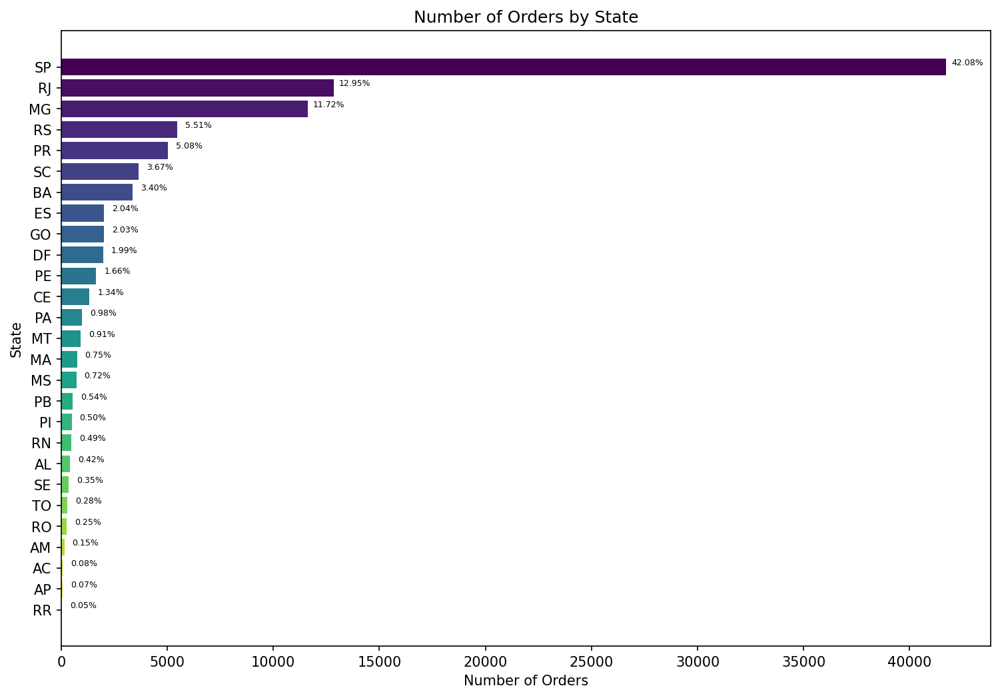

In [37]:
# Customer Orders by State

orders_ct = order_geo.groupby('customer_state').agg({'order_id': 'nunique'}).sort_values(by='order_id', ascending=True)  ## usingn nunique to count unique order ids
orders_ct.rename(columns={'order_id': 'n_orders'}, inplace=True)

colors = plt.cm.viridis(np.linspace(1, 0, len(orders_ct)))

total = sum(orders_ct.n_orders)
percentages = [f"{(value / total * 100):.2f}%" for value in orders_ct.n_orders]

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (12,8)
plt.rcParams["figure.dpi"] = 150

bars = plt.barh(orders_ct.index, orders_ct.n_orders, color=colors)

for bar, value, percentage in zip(bars, orders_ct.n_orders, percentages):
    xval = bar.get_width()
    plt.text(xval + 1000, bar.get_y() + bar.get_height()/2, f"{percentage}", ha='center', va='bottom', fontsize=6)

plt.ylabel('State')
plt.xlabel('Number of Orders')
plt.title('Number of Orders by State')
plt.show()

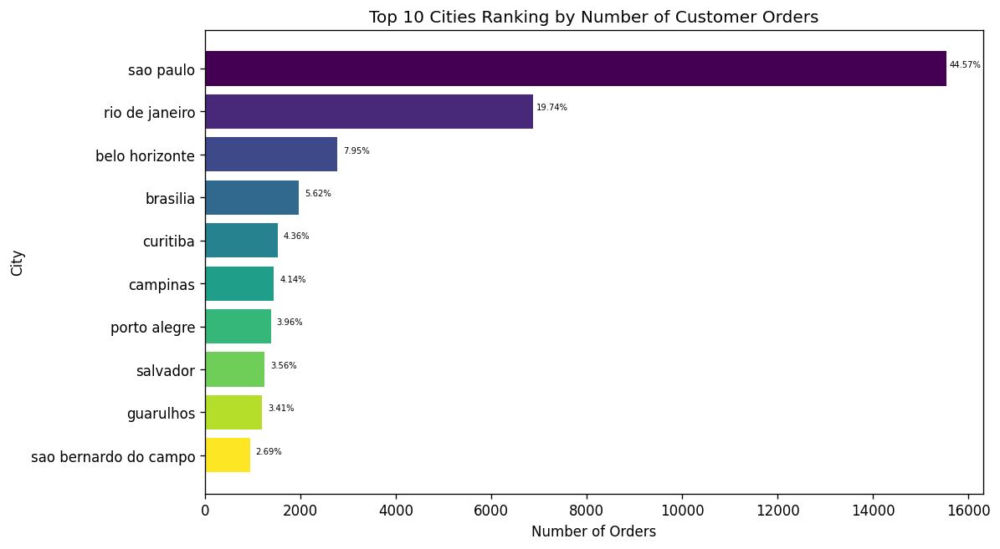

In [38]:
# Top 10 Customer Orders by City

orders_ct_city = order_geo.groupby('customer_city').agg({'order_id': 'nunique'}).sort_values(by='order_id', ascending=False).head(10)  ## usingn nunique to count unique order ids
orders_ct_city.rename(columns={'order_id': 'n_orders'}, inplace=True)
orders_ct_city.sort_values(by='n_orders', ascending=True, inplace=True)

colors = plt.cm.viridis(np.linspace(1, 0, len(orders_ct_city)))

total = sum(orders_ct_city.n_orders)
percentages = [f"{(value / total * 100):.2f}%" for value in orders_ct_city.n_orders]

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (10,6)
plt.rcParams["figure.dpi"] = 120

bars = plt.barh(orders_ct_city.index, orders_ct_city.n_orders, color=colors)

for bar, value, percentage in zip(bars, orders_ct_city.n_orders, percentages):
    xval = bar.get_width()
    plt.text(xval + 400, bar.get_y() + bar.get_height()/2, f"{percentage}", ha='center', va='bottom', fontsize=6)

plt.ylabel('City')
plt.xlabel('Number of Orders')
plt.title('Top 10 Cities Ranking by Number of Customer Orders')
plt.show()

In [39]:
# Interactive Map of Customer Order Locations

lats = list(customer_geo['geolocation_lat'].values)
longs = list(customer_geo['geolocation_lng'].values)
locations = list(zip(lats, longs))

customer_map = folium.Map(location=[-15, -50], zoom_start=4.0)

FastMarkerCluster(data=locations).add_to(customer_map)
HeatMap(data=locations).add_to(customer_map)

customer_map.save('customer_geomap.html')

customer_map

### Summary:   
From above we can see that São Paulo state has the highest number of orders. São Paulo is the most populous and wealthiest state in Brazil, whose GDP accounts for approximately one-third of Brazil's total, reflecting a high concentration of purchasing power. Several actionable insights are:  
* Olist can focus on strengthening partnerships with local logistics providers within São Paulo to enhance delivery efficiency and service quality.  
* Olist can analyze purchasing patterns within São Paulo to offer personalized recommendations, promotions, and products that cater to the local market's preferences.

## IV.2. Customer Purchase Preferences

### 2.1 Purchase Preference By Time
* By Time of Day  
* By Day of Week

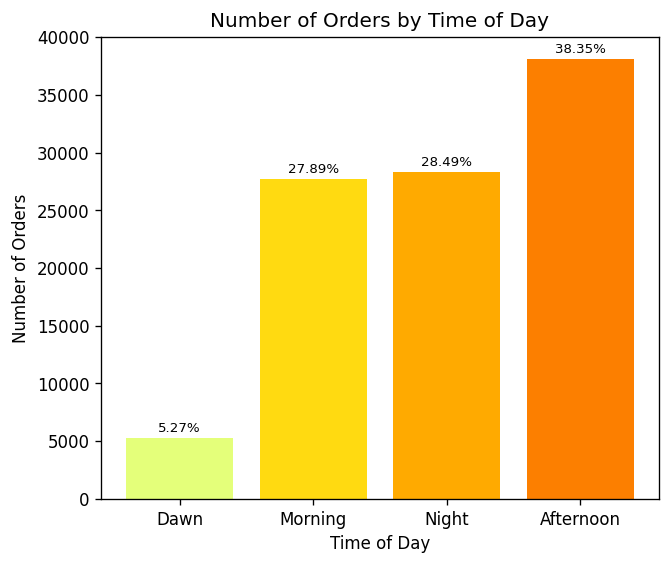

In [40]:
# By Time of Day

order_time_day = order_payment.groupby('order_purchase_time_day').agg({'order_id': 'nunique'}).sort_values(by='order_id', ascending=True)
order_time_day.rename(columns={'order_id': 'n_orders'}, inplace=True)

colors = plt.cm.Wistia(np.linspace(0, 1, len(order_time_day)))

total = sum(order_time_day.n_orders)
percentages = [f"{(value / total * 100):.2f}%" for value in order_time_day.n_orders]

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (6,5)
plt.rcParams["figure.dpi"] = 120

bars = plt.bar(order_time_day.index, order_time_day.n_orders, color=colors)

for bar, value, percentage in zip(bars, order_time_day.n_orders, percentages):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 300, f"{percentage}", ha='center', va='bottom', fontsize=8)

plt.ylabel('Number of Orders')
plt.xlabel('Time of Day')
plt.title('Number of Orders by Time of Day')

plt.show()

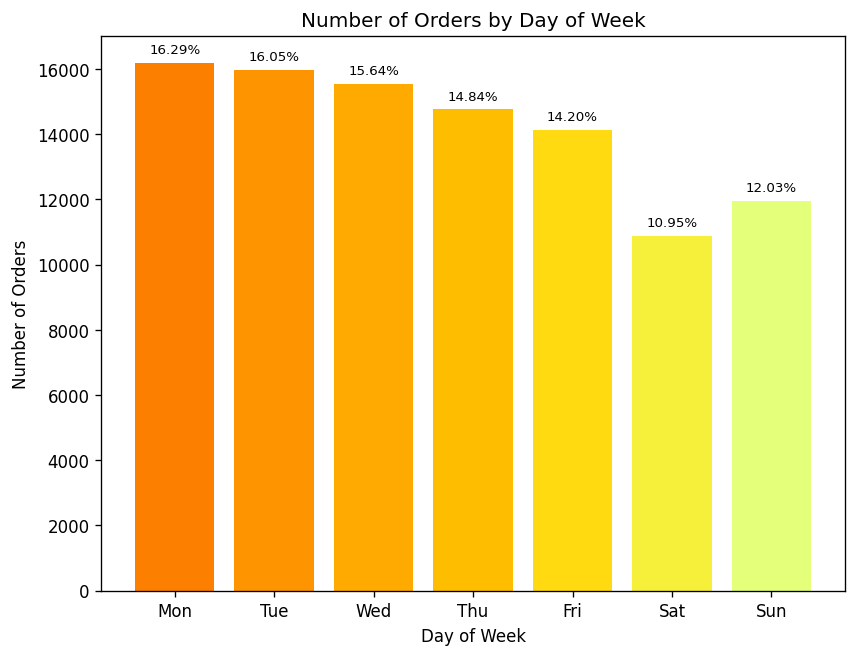

In [41]:
# By Day of Week

order_dayofweek = order_payment.groupby('order_purchase_dayofweek_name').agg({'order_id': 'nunique'}).reindex(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
order_dayofweek.rename(columns={'order_id': 'n_orders'}, inplace=True)

colors = plt.cm.Wistia(np.linspace(1, 0, len(order_dayofweek)))

total = sum(order_dayofweek.n_orders)
percentages = [f"{(value / total * 100):.2f}%" for value in order_dayofweek.n_orders]

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (8,6)
plt.rcParams["figure.dpi"] = 120

bars = plt.bar(order_dayofweek.index, order_dayofweek.n_orders, color=colors)

for bar, value, percentage in zip(bars, order_dayofweek.n_orders, percentages):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 200, f"{percentage}", ha='center', va='bottom', fontsize=8)

plt.ylabel('Number of Orders')
plt.xlabel('Day of Week')
plt.title('Number of Orders by Day of Week')

plt.show()


### 2.2 Purchase Preference By Payment Method

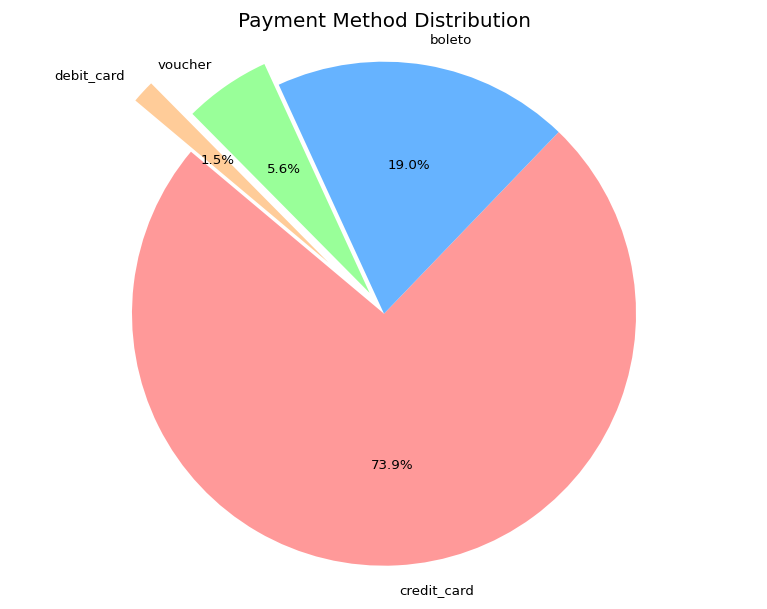

In [42]:
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']

order_payment.payment_type.value_counts().head(4).plot.pie(colors=colors, autopct='%1.1f%%', startangle=140, textprops={'fontsize': 8}, explode=(0,0,0.1,0.3))

plt.axis('equal')
plt.title('Payment Method Distribution')
plt.ylabel('')
plt.show()

### Summary: 

From above we can see that customers generally prefer to purchase in the afternoons compared with dawns, prefer to purchase on weekdays compared with weekends, and prefer to use credit card for payment. Some actionable insights:  
* Traffic is heavier in afternoons and on weekdays, so Olist should put more efforts on optimizing the latency of websites and transaction reliability during these peak times, and also could schedule more customer support staff to handle inquiries and issues more promptly.  
* Olist should develop weekend-specific strategies to improve weekend engagement and fully exploit the potential of weenkends, such as weekend-only deals or previews of upcoming week's promotions.
* High usage of credit cards emphasizes the importance of secure transactions, and also, Olist could partner with credit card companies to offer exclusive discounts and cashback to enhance customer retention.


## IV.3. Monthly GMV Trend Analysis

GMV is the total value of merchandise sold over a certain time period through the platform. It is a popular **North-Star Metric** for e-commerce platforms, because it directly reflects the volume of business being conducted. For a marketplace like Olist, which connects sellers and buyers, GMV can be a clear indicator of the platform's health and growth.  
Note: We included freight values in calculating GMV, i.e. we used the sum of payment values to represent GMV of Olist.

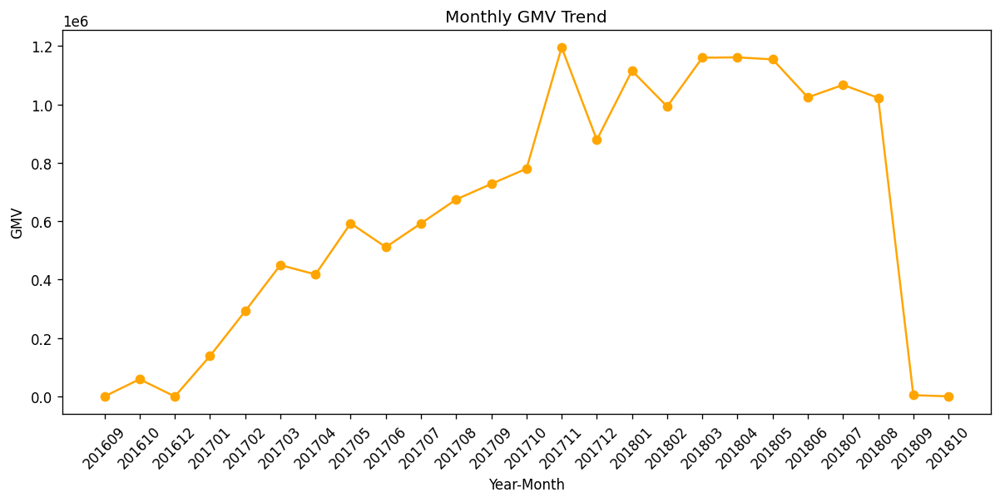

In [43]:
monthly_gmv = order_payment.groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (12,5)
plt.rcParams["figure.dpi"] = 120

plt.plot(monthly_gmv.index, monthly_gmv.payment_value, marker='o', linestyle='-', color='orange')
plt.xticks(rotation=45)
plt.xlabel('Year-Month')
plt.ylabel('GMV')
plt.title('Monthly GMV Trend')

plt.show()

From above we can see that GMV data in 2016 and after 09/2018 are suspicious. Let's decompose the GMV by payment methods to dive deep into the root cause:

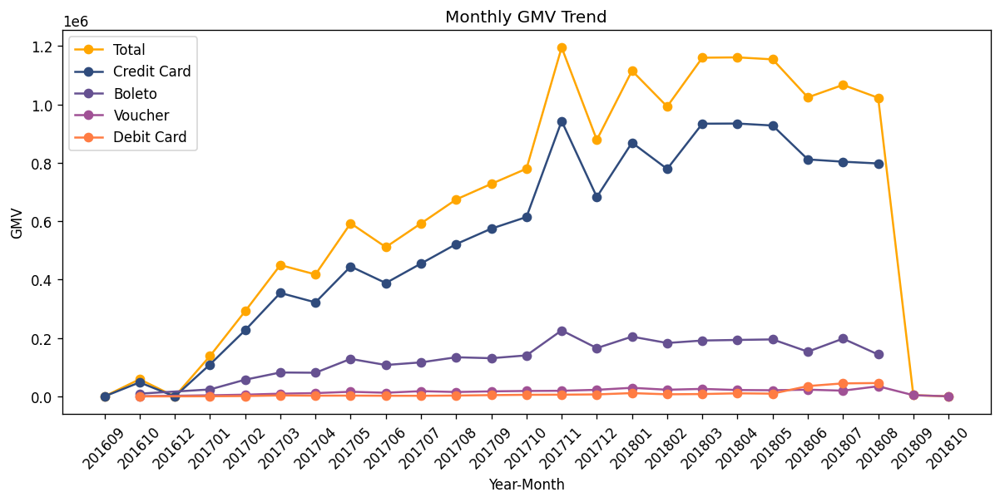

In [44]:
# Monthly GMV Trend by Payment Type
monthly_gmv_credit_card = order_payment.query('payment_type == "credit_card"').groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()
monthly_gmv_boleto = order_payment.query('payment_type == "boleto"').groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()
monthly_gmv_voucher = order_payment.query('payment_type == "voucher"').groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()
monthly_gmv_debit_card = order_payment.query('payment_type == "debit_card"').groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (12,5)
plt.rcParams["figure.dpi"] = 120


plt.plot(monthly_gmv.index, monthly_gmv.payment_value, marker='o', linestyle='-', color='#ffa600')
plt.plot(monthly_gmv_credit_card.index, monthly_gmv_credit_card.payment_value, marker='o', linestyle='-', color='#2f4b7c')
plt.plot(monthly_gmv_boleto.index, monthly_gmv_boleto.payment_value, marker='o', linestyle='-', color='#665191')
plt.plot(monthly_gmv_voucher.index, monthly_gmv_voucher.payment_value, marker='o', linestyle='-', color='#a05195')
plt.plot(monthly_gmv_debit_card.index, monthly_gmv_debit_card.payment_value, marker='o', linestyle='-', color='#ff7c43')

plt.legend(['Total', 'Credit Card', 'Boleto', 'Voucher', 'Debit Card'])
plt.xticks(rotation=45)
plt.xlabel('Year-Month')
plt.ylabel('GMV')
plt.title('Monthly GMV Trend')

plt.show()

So we found out that the GMV after 08/2018 is only composed of 'Voucher' payments, which is pretty weird.  
To ensure the effectiveness, we remove these data, i.e.  
We will be focusing on data between 01/2017 and 08/2018 in the following year-over-year analyses. 

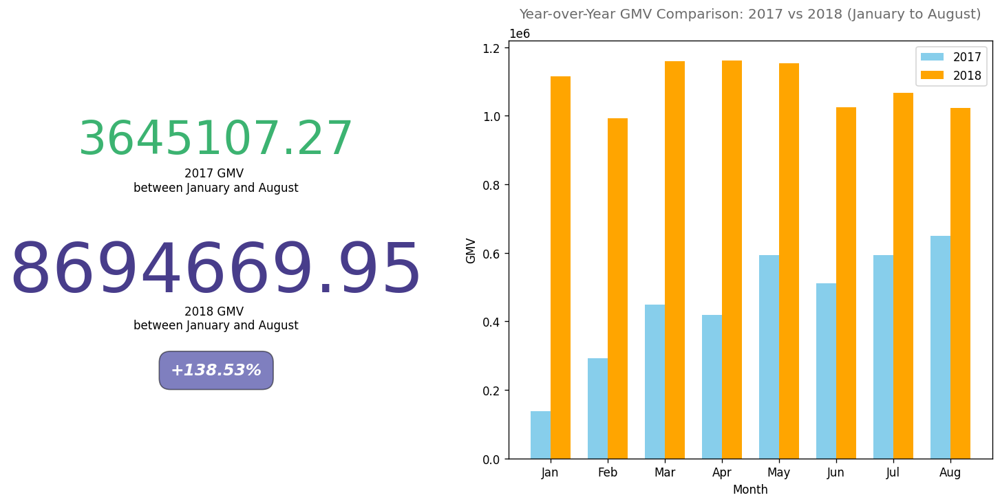

In [45]:
# Year-over-Year GMV Analysis: 2017 vs 2018 (Jan - Aug)

fig = plt.figure(constrained_layout=True, figsize=(12, 6))

gs = GridSpec(1, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1:])


order_payment_17 = order_payment.query('order_purchase_timestamp >= "2017-01-01" and order_purchase_timestamp <= "2017-08-31"')
order_payment_18 = order_payment.query('order_purchase_timestamp >= "2018-01-01" and order_purchase_timestamp <= "2018-08-31"')

monthly_gmv_17 = order_payment_17.groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()
monthly_gmv_18 = order_payment_18.groupby('order_purchase_year_month').agg({'payment_value': 'sum'}).sort_index()

ax1.text(0.00, 0.73, f'{round(order_payment_17.payment_value.sum(), 2)}', fontsize=40, color='mediumseagreen', ha='center')
ax1.text(0.00, 0.64, '2017 GMV \nbetween January and August', fontsize=10, ha='center')
ax1.text(0.00, 0.40, f'{round(order_payment_18.payment_value.sum(), 2)}', fontsize=60, color='darkslateblue', ha='center')
ax1.text(0.00, 0.31, '2018 GMV \nbetween January and August', fontsize=10, ha='center')
ax1.text(0.00, 0.20, f'+{round(100*(order_payment_18.payment_value.sum()-order_payment_17.payment_value.sum())/order_payment_17.payment_value.sum(), 2)}%', 
         fontsize=14, ha='center', color='white', style='italic', weight='bold',
         bbox=dict(facecolor='navy', alpha=0.5, pad=10, boxstyle='round, pad=.7'))
ax1.axis('off')

bar_width = 0.35
ax2.bar(np.arange(8), monthly_gmv_17.payment_value.values, bar_width, color='skyblue')
ax2.bar(np.arange(8)+bar_width, monthly_gmv_18.payment_value.values, bar_width, color='orange')

month_label = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug']
ax2.set_xticks(np.arange(8)+bar_width/2)
ax2.set_xticklabels(month_label)
ax2.set_xlabel('Month')
ax2.set_ylabel('GMV')
ax2.set_title('Year-over-Year GMV Comparison: 2017 vs 2018 (January to August)', size=12, color='dimgrey', pad=20)
ax2.legend(['2017', '2018'])


plt.show()


### Summary:
Above indicates that the GMV of Olist in 2018 was 138% higher than 2017, with each month showing a year-over-year growth, presenting a picture of robust and accelerating growth during this period. This substantial increase in GMV suggests putting a stronger focus on customer acquisition, platform technology improvements, and a potential of market expansion. 


# V. Statistical Analysis

In this part, we utilized statistical and graphical analytic methods to investigate into Olist Data, focusing on mainly two aespects:  
* Customer-wise Data  
* Time Series Data of GMV

**Note:** We incoporated graphical analysis in each part of following statistical analysis, aiding statistical methods with data visualization.

## V.1. Descriptive Statistics

### Customer RFM 

In [46]:
rfm.head()

,customer_unique_id,order_purchase_timestamp,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,160,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,163,1,27.19
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,585,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,369,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,336,1,196.89


In [47]:
rfm[['Recency', 'Frequency', 'Monetary']].describe()

,Recency,Frequency,Monetary
count,95826.000000,95826.000000,95826.000000
mean,287.758656,1.081105,166.593165
std,153.429504,0.462975,231.497146
min,0.000000,1.000000,0.000000
25%,163.000000,1.000000,63.120000
50%,268.000000,1.000000,108.000000
75%,397.000000,1.000000,183.520000
max,772.000000,33.000000,13664.080000


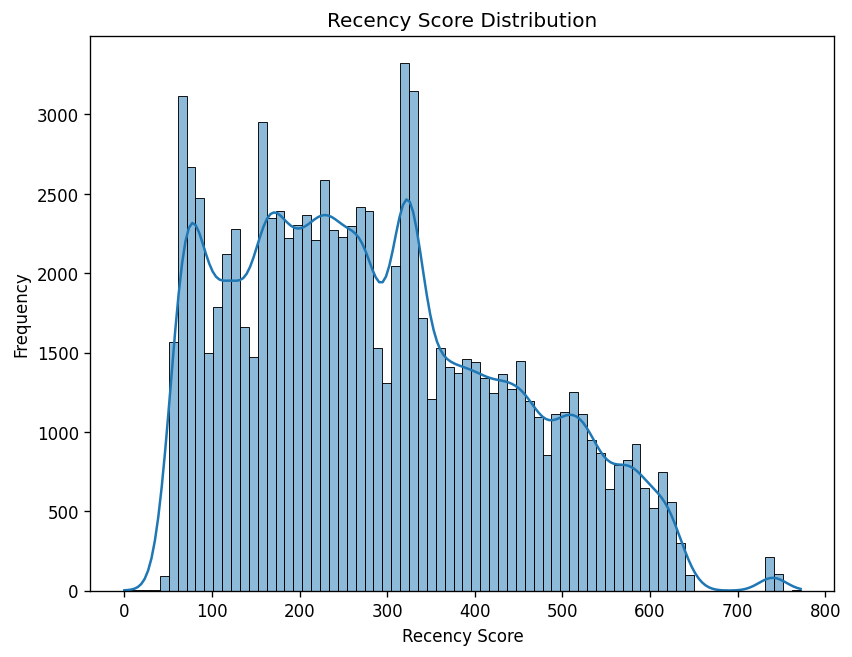

In [48]:
# Histogram of Recency

plt.figure(figsize=(8, 6))
sns.histplot(rfm['Recency'], kde=True)
plt.xlabel('Recency Score')
plt.ylabel('Frequency')
plt.title('Recency Score Distribution')
plt.show()


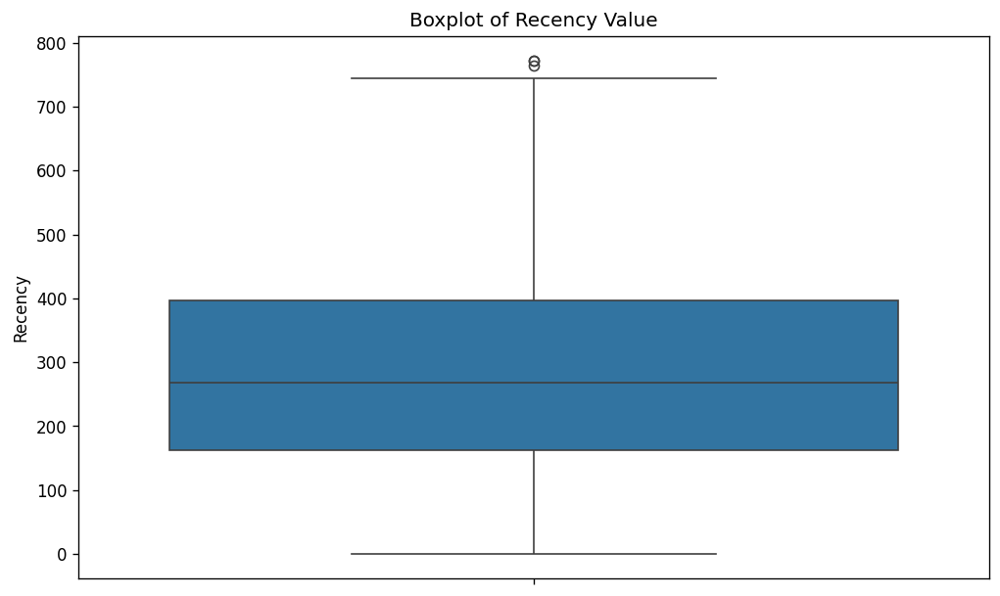

In [49]:
plt.figure(figsize=(10, 6))
sns.boxplot(rfm.Recency)
plt.title('Boxplot of Recency Value')
plt.show()

In [50]:
rfm.Frequency.value_counts(normalize=True).sort_index()

Frequency
1     0.940402
2     0.049924
3     0.005771
4     0.001701
5     0.000710
6     0.000532
7     0.000313
8     0.000146
9     0.000115
10    0.000063
11    0.000073
12    0.000063
13    0.000042
14    0.000031
15    0.000021
16    0.000010
17    0.000010
19    0.000021
22    0.000010
23    0.000010
26    0.000010
29    0.000010
33    0.000010
Name: proportion, dtype: float64

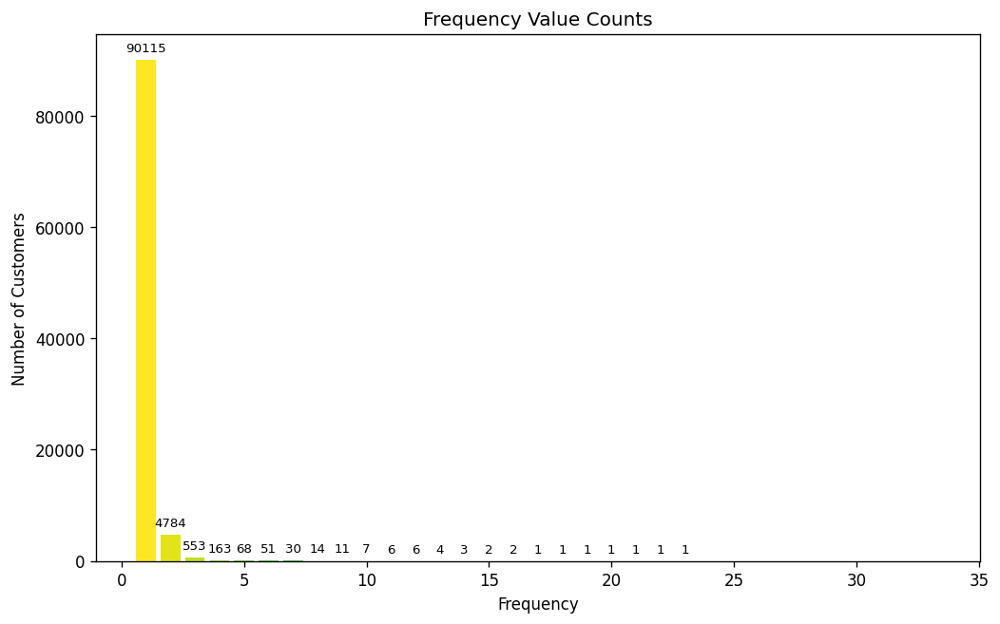

In [51]:
# barplot of Frequency 

plt.figure(figsize=(10, 6))

colors = plt.cm.viridis(np.linspace(1, 0, len(rfm.Frequency.value_counts())))

plt.bar(rfm.Frequency.value_counts().index, rfm.Frequency.value_counts().values, color=colors)

for i, v in enumerate(rfm.Frequency.value_counts().values):
    plt.text(i+1, v+1000, str(v), ha='center', va='bottom', fontsize=8)

plt.title('Frequency Value Counts')
plt.xlabel('Frequency')
plt.ylabel('Number of Customers')
plt.show()

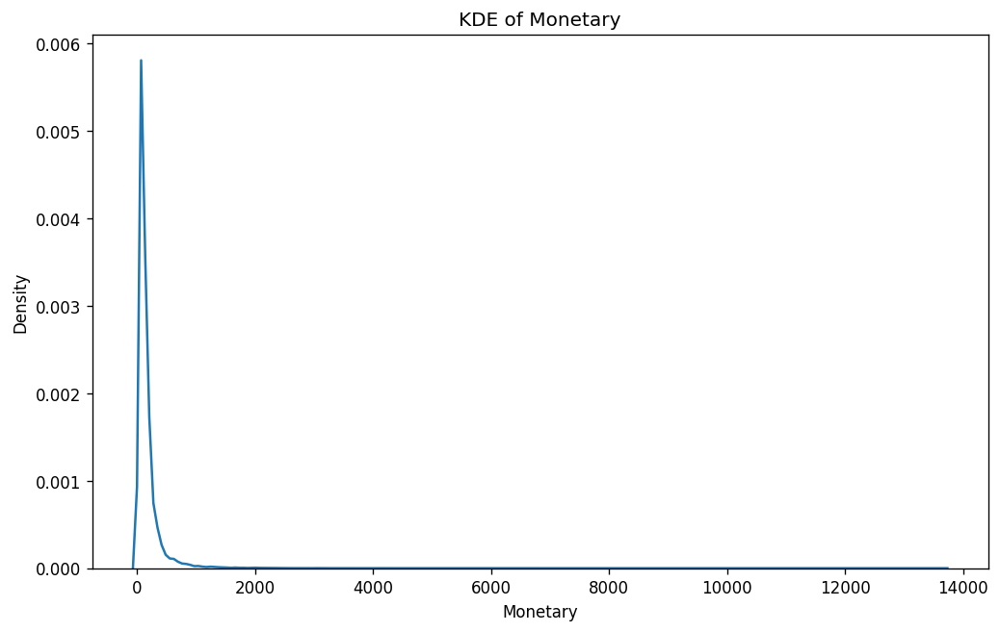

In [52]:
# KDE of Monetary

plt.figure(figsize=(10, 6))
sns.kdeplot(rfm.Monetary)
plt.title('KDE of Monetary')
plt.xlabel('Monetary')
plt.ylabel('Density')
plt.show()


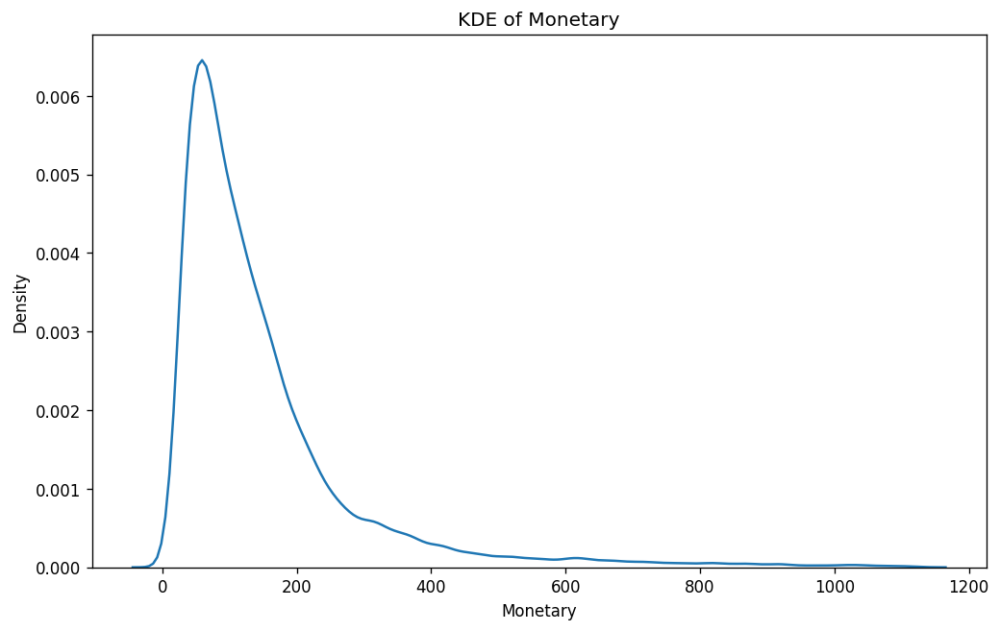

In [53]:
# KDE of Monetary

plt.figure(figsize=(10, 6))
sns.kdeplot(rfm[rfm.Monetary < rfm.Monetary.quantile(0.99)].Monetary)
plt.title('KDE of Monetary')
plt.xlabel('Monetary')
plt.ylabel('Density')
plt.show()

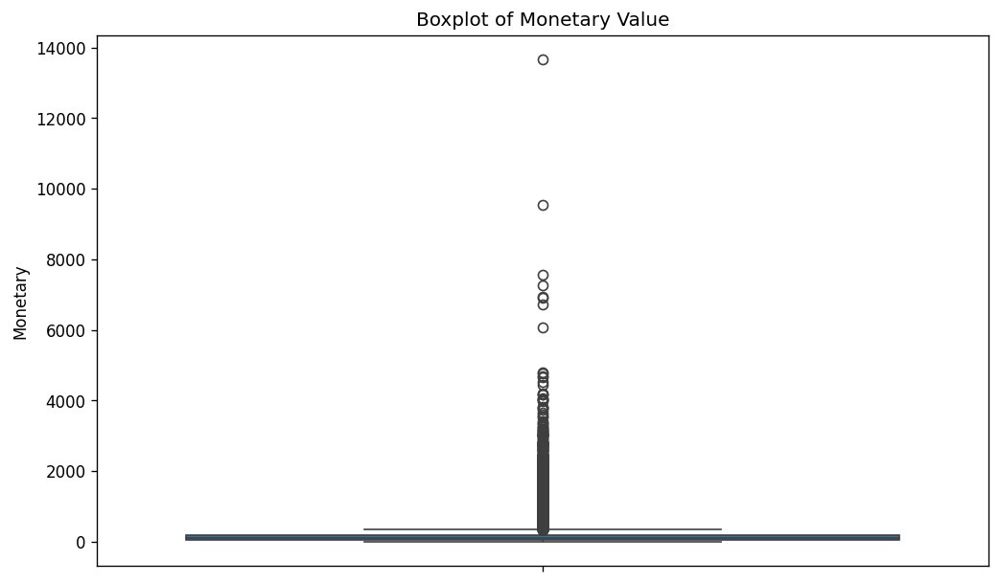

In [54]:
# boxplot of Monetary
plt.figure(figsize=(10, 6))
sns.boxplot(rfm.Monetary)
plt.title('Boxplot of Monetary Value')
plt.show()

Through descriptive analysis of RFM values, we found that:  
* Recency value is primarily concentrated between 150 and 400, a little bit right-skewed, indicating that most of our customers had their latest purchase between 5 months and 13 months prior to the cut-off date of our data.  
* 94% of the Frequency scores are 1, indicating that most of the customers only purchased once within our data, but there are some of customers who purchased more than once. These are returning customers of Olist E-commerce Platform, related to the platform's retention rate.  
* Monetary value is extremely right-skewed, with 99% of the data < 1000, but outliers can have extremely high values, up to > 10000.  

### Customer Review Features

In [55]:
customer_review_agg.head()

,customer_unique_id,avg_review_score,order_counts,review_score_counts,review_comment_counts,rating_rate,comment_rate
0,0000366f3b9a7992bf8c76cfdf3221e2,5.0,1,1,1,1.0,1.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,4.0,1,1,0,1.0,0.0
2,0000f46a3911fa3c0805444483337064,3.0,1,1,0,1.0,0.0
3,0000f6ccb0745a6a4b88665a16c9f078,4.0,1,1,1,1.0,1.0
4,0004aac84e0df4da2b147fca70cf8255,5.0,1,1,0,1.0,0.0


In [56]:
customer_review_agg.info()

## only avg_review_score has missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96096 entries, 0 to 96095
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   customer_unique_id     96096 non-null  object 
 1   avg_review_score       95380 non-null  float64
 2   order_counts           96096 non-null  int64  
 3   review_score_counts    96096 non-null  int64  
 4   review_comment_counts  96096 non-null  int64  
 5   rating_rate            96096 non-null  float64
 6   comment_rate           96096 non-null  float64
dtypes: float64(3), int64(3), object(1)
memory usage: 5.1+ MB


In [57]:
customer_review_agg[['avg_review_score', 'rating_rate', 'comment_rate']].describe()

,avg_review_score,rating_rate,comment_rate
count,95380.000000,96096.000000,96096.000000
mean,4.084989,0.992340,0.427640
std,1.341571,0.086584,0.492924
min,1.000000,0.000000,0.000000
25%,4.000000,1.000000,0.000000
50%,5.000000,1.000000,0.000000
75%,5.000000,1.000000,1.000000
max,5.000000,1.000000,1.000000


In [58]:
avg_review_score = customer_review_agg.avg_review_score.value_counts().reset_index().sort_values(by='avg_review_score')
avg_review_score['avg_review_score'] = avg_review_score['avg_review_score'].round(2)
avg_review_score['log_count'] = np.log10(avg_review_score['count'])

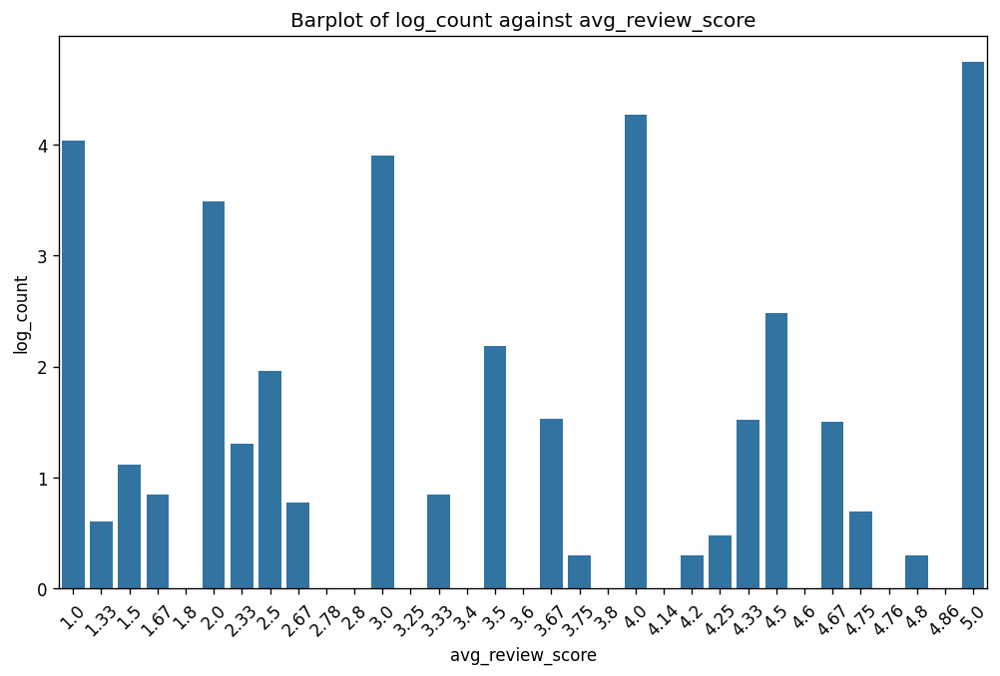

In [59]:
plt.figure(figsize=(10, 6))
sns.barplot(x='avg_review_score', y='log_count', data=avg_review_score)
plt.title('Barplot of log_count against avg_review_score')
plt.xticks(rotation=45)
plt.xlabel('avg_review_score')
plt.ylabel('log_count')
plt.show()


In [60]:
customer_review_agg.rating_rate.value_counts().sort_index()

rating_rate
0.000000      716
0.333333        2
0.500000       35
0.666667        3
0.750000        1
1.000000    95339
Name: count, dtype: int64

In [61]:
customer_review_agg.comment_rate.value_counts().sort_index()

comment_rate
0.000000    54646
0.142857        1
0.166667        2
0.200000        1
0.250000       11
0.333333       48
0.400000        3
0.500000      584
0.600000        2
0.666667       46
0.750000        6
0.800000        1
0.833333        2
1.000000    40743
Name: count, dtype: int64

Most of the customers scored their order, and only a small proportion of customers only scored some of their orders.  
For commenting, the proportion of customers who never wrote review comments is almost equal to the proportion of customers who always wrote review comments for their orders, and a small proportion of customers only wrote review comments for some of their orders.  
It's understandable that people are generally much more willing to merely score an order compared to writing a comment, simply because the former one requires much less effort.  
However, the rating rate and comment rate of a customer can be pontential factors that may influence customer's LTV. 

### Customer Payment Method Features

In [62]:
customer_paytype.head()

,customer_unique_id,most_frequent_payment_types,n_payment_types
0,0000366f3b9a7992bf8c76cfdf3221e2,credit_card,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,credit_card,1
2,0000f46a3911fa3c0805444483337064,credit_card,1
3,0000f6ccb0745a6a4b88665a16c9f078,credit_card,1
4,0004aac84e0df4da2b147fca70cf8255,credit_card,1


In [63]:
customer_paytype.most_frequent_payment_types.value_counts(normalize=True)

most_frequent_payment_types
credit_card    0.757237
boleto         0.199361
voucher        0.027863
debit_card     0.015507
not_defined    0.000031
Name: proportion, dtype: float64

In [64]:
customer_paytype.n_payment_types.value_counts(normalize=True).sort_index()

n_payment_types
1    0.973567
2    0.026245
3    0.000188
Name: proportion, dtype: float64

In [65]:
customer_paytype[customer_paytype.n_payment_types==1].most_frequent_payment_types.value_counts(normalize=True)

most_frequent_payment_types
credit_card    0.765352
boleto         0.203359
debit_card     0.015671
voucher        0.015596
not_defined    0.000021
Name: proportion, dtype: float64

More than 75% customers used credit card as their most frequent payment method, followed by boleto accounting for 20%, which is a type of financial document that represents a cash-based invoice in Brazil. Notice that only a small proportion of customer used debit card as their first choice.  
  
Credit card V.S. debit card: Credit card is much more popular in Brazil than debit card, and the following reasons may serve as explanation:  
* Credit cards provide access to credit and the ability to make purchases even when consumers do not have immediate funds. This is particularly appealing in Brazil, where credit cards often offer the option to pay in installments without interest. This feature makes larger purchases more manageable for consumers and is a significant advantage over debit cards, which deduct funds directly from one's bank account.
* Rewards and Benefits: Credit cards in Brazil frequently come with rewards programs, offering points, cashback, or miles that can be redeemed for various goods and services. These incentives encourage the use of credit cards over debit cards, which typically do not offer comparable rewards.
* Security Concerns: Credit cards generally offer better fraud protection than debit cards. In the case of fraudulent transactions, credit card users are often able to dispute charges without having immediate funds withdrawn from their bank account, as would be the case with a debit card.
  
More about boleto: Although Brazil has made significant strides in financial inclusion, a segment of the population remains unbanked or underbanked, with limited access to banking services, including credit cards and debit cards. Boleto bancário serves as an inclusive payment option for these consumers, allowing them to participate in e-commerce even without bank account.

Customers behavior in payment method choice may influence customer's LTV in following aspects:  
1. Impact of Most Frequently Used Payment Method  
* Payment Flexibility and Convenience: Customers who use credit cards most frequently may perceive a higher level of payment flexibility and convenience, potentially leading to higher transaction values and more frequent purchases. Also, Credit cards often offer benefits such as reward points and cashback, which can incentivize customers to spend more, positively impacting their LTV.  
* Loyalty: A customer’s trust in their preferred payment method can lead to increased satisfaction and loyalty, thereby enhancing LTV.  
* Payment Method Accessibility: In regions like Brazil, where a significant portion of the population may be unbanked or have limited access to traditional banking services, alternative payment methods like boleto bancário are popular. Customers using such inclusive payment options might exhibit different shopping behaviors compared to those using bank-related payment methods, potentially affecting their LTV.  
  
2. Impact of Number of Different Payment Methods Used  
* Flexibility in Payment Method: Customers who use multiple payment methods might be more engaged and have a higher potential LTV. This behavior can indicate that they are more committed to finding ways to make purchases from the platform, suggesting a higher level of loyalty and engagement.  
* Risk Diversification: Customers who use multiple payment methods might be less impacted by issues with a single payment method (e.g., credit card fraud or expiration). This can lead to more consistent purchasing behavior over time, positively affecting LTV.  

### Customer Product Purchase Features

In [66]:
customer_product_agg.head()

,customer_unique_id,most_frequent_product_category
0,0000366f3b9a7992bf8c76cfdf3221e2,bed_bath_table
1,0000b849f77a49e4a4ce2b2a4ca5be3f,health_beauty
2,0000f46a3911fa3c0805444483337064,stationery
3,0000f6ccb0745a6a4b88665a16c9f078,telephony
4,0004aac84e0df4da2b147fca70cf8255,telephony


In [67]:
customer_product_agg.most_frequent_product_category.value_counts()

most_frequent_product_category
bed_bath_table               8901
health_beauty                8542
sports_leisure               7373
computers_accessories        6449
furniture_decor              6081
                             ... 
arts_and_craftmanship          19
cds_dvds_musicals              12
la_cuisine                     10
fashion_childrens_clothes       7
security_and_services           2
Name: count, Length: 71, dtype: int64

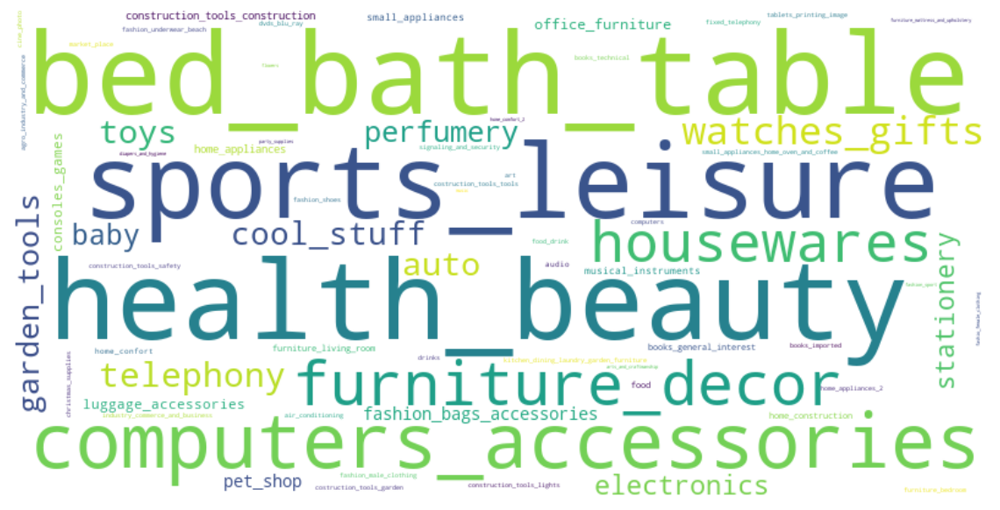

In [68]:
# generste wordcloud for most frequent product category

category_wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(Counter(customer_product_agg.most_frequent_product_category.dropna()))
plt.figure(figsize=(12, 8))
plt.imshow(category_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

further categorize

## V.2. Inferential Statistics

Hypothesis Testing  
问问这玩意和comparative, multivariate的关系

### Customer Purchase Preference

分两个部分：一天之中四个时段，一个星期七天～order_count的关系

## USE ANOVA

First: Check-nomality -> normal dist -> ANOVA
                      -> not normal dist -> Use Kruskal-Wallis H
                                         -> Box-cox transformation
                      

Check Nomality

In [74]:
order_daybytime = order_payment.pivot_table(
    index='order_purchase_date', 
    columns='order_purchase_time_day', 
    values='order_id', 
    aggfunc='count').reset_index()

In [87]:
totals = order_daybytime[['Dawn', 'Morning', 'Afternoon', 'Night']].sum(axis=1)

order_daybytime['Dawn'] = order_daybytime['Dawn'] / totals
order_daybytime['Morning'] = order_daybytime['Morning'] / totals
order_daybytime['Afternoon'] = order_daybytime['Afternoon'] / totals
order_daybytime['Night'] = order_daybytime['Night'] / totals

order_daybytime.head(10)

order_purchase_time_day,order_purchase_date,Dawn,Morning,Afternoon,Night
0,20160904,0.000000,0.000000,0.000000,1.000000
1,20160905,1.000000,0.000000,0.000000,0.000000
2,20160913,0.000000,0.000000,1.000000,0.000000
3,20161002,0.000000,0.000000,0.000000,1.000000
4,20161003,0.000000,0.125000,0.125000,0.750000
5,20161004,0.000000,0.142857,0.571429,0.285714
6,20161005,0.039216,0.392157,0.313725,0.254902
7,20161006,0.058824,0.313725,0.411765,0.215686
8,20161007,0.042553,0.425532,0.276596,0.255319
9,20161008,0.069767,0.325581,0.302326,0.302326


<Axes: >

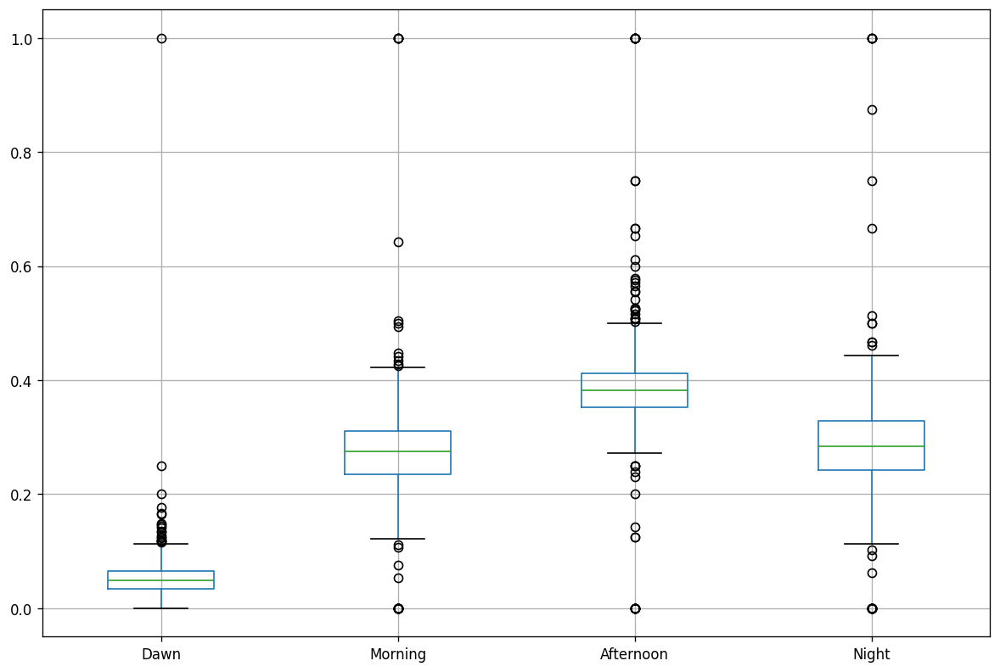

In [76]:
# By 4 Segments of Days

order_daybytime.boxplot(column=['Dawn', 'Morning', 'Afternoon', 'Night'], figsize=(12, 8))


In [80]:
# shapiro-wilk test for normality
from scipy.stats import shapiro

In [81]:
shapiro(order_daybytime['Dawn']), shapiro(order_daybytime['Morning']), shapiro(order_daybytime['Afternoon']), shapiro(order_daybytime['Night'])

(ShapiroResult(statistic=0.4689263105392456, pvalue=1.3797324809588581e-39),
 ShapiroResult(statistic=0.742851197719574, pvalue=3.6362618116133195e-30),
 ShapiroResult(statistic=0.6884015798568726, pvalue=1.570915809822726e-32),
 ShapiroResult(statistic=0.7941544055938721, pvalue=1.5237964460746615e-27))

All the p-value << 0.05, so we can reject the null hypothesis of the normality of the data set.


Use the Kruskal-Wallis Hypothesis test:

The Kruskal-Wallis H test is a non-parametric method that does not assume that the data comes from a specific distribution. So, when the data is not follow normal distribution, we can use Kruskal-Wallis H test instead of ANOVA.

Null Hypothesis (H0): The population medians of all groups are equal. This means there is no statistically significant difference across the different groups.

Alternative Hypothesis (Ha): At least one group's population median is different from the others. This suggests that there is a statistically significant difference in at least one group when compared to the others.


In [96]:
# use kruskal-wallis test to compare the 4 segments
from scipy.stats import kruskal
stat1, p1 = kruskal(order_daybytime['Dawn'], order_daybytime['Morning'], order_daybytime['Afternoon'], order_daybytime['Night'])
print('Kruskal-Wallis H test statistic:', stat1)
print('P-value:', p1)


Kruskal-Wallis H test statistic: 1683.8301712118937
P-value: 0.0


Since p << 0.05, There is a statistically significant difference between groups.

### Day of WEEK

In [97]:
order_payment['order_purchase_week'] = order_payment['order_purchase_timestamp'].apply(lambda x: x.strftime('%Y%U'))

In [98]:
order_weekbyday = order_payment.pivot_table(
    index='order_purchase_week', 
    columns='order_purchase_dayofweek_name', 
    values='order_id', 
    aggfunc='count',
    fill_value=0).reset_index()
order_weekbyday
    
totals = order_weekbyday[['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']].sum(axis=1)
order_weekbyday['Mon'] = order_weekbyday['Mon'] / totals
order_weekbyday['Tue'] = order_weekbyday['Tue'] / totals
order_weekbyday['Wed'] = order_weekbyday['Wed'] / totals
order_weekbyday['Thu'] = order_weekbyday['Thu'] / totals
order_weekbyday['Fri'] = order_weekbyday['Fri'] / totals
order_weekbyday['Sat'] = order_weekbyday['Sat'] / totals
order_weekbyday['Sun'] = order_weekbyday['Sun'] / totals

order_weekbyday

order_purchase_dayofweek_name,order_purchase_week,Fri,Mon,Sat,Sun,Thu,Tue,Wed
0,201636,0.000000,0.50000,0.000000,0.50000,0.000000,0.000000,0.000000
1,201637,0.000000,0.00000,0.000000,0.00000,0.000000,1.000000,0.000000
2,201640,0.173432,0.02952,0.158672,0.00369,0.188192,0.258303,0.188192
3,201641,0.000000,0.60000,0.000000,0.40000,0.000000,0.000000,0.000000
4,201642,0.000000,0.00000,1.000000,0.00000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...
95,201836,0.000000,0.25000,0.000000,0.00000,0.250000,0.250000,0.250000
96,201837,0.000000,0.50000,0.000000,0.00000,0.500000,0.000000,0.000000
97,201838,0.000000,0.00000,0.333333,0.00000,0.000000,0.333333,0.333333
98,201839,0.000000,0.50000,0.000000,0.00000,0.000000,0.000000,0.500000


<Axes: >

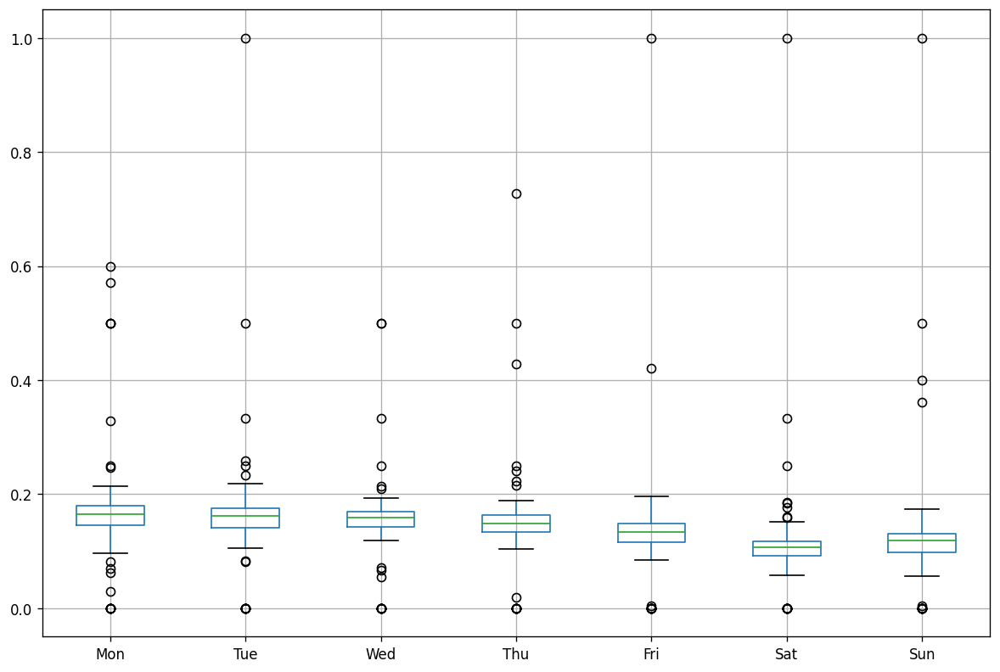

In [99]:
order_weekbyday.boxplot(column=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], figsize=(12, 8))


Check Normality:

In [100]:
shapiro(order_weekbyday['Mon']), shapiro(order_weekbyday['Tue']), shapiro(order_weekbyday['Wed']), shapiro(order_weekbyday['Thu']), shapiro(order_weekbyday['Fri']), shapiro(order_weekbyday['Sat']), shapiro(order_weekbyday['Sun'])

(ShapiroResult(statistic=0.7028911113739014, pvalue=6.300940129898291e-13),
 ShapiroResult(statistic=0.5350791215896606, pvalue=2.9364154709935874e-16),
 ShapiroResult(statistic=0.7038443088531494, pvalue=6.634250440673561e-13),
 ShapiroResult(statistic=0.6157243847846985, pvalue=8.64613200777858e-15),
 ShapiroResult(statistic=0.4621771574020386, pvalue=1.9634845757175322e-17),
 ShapiroResult(statistic=0.42487645149230957, pvalue=5.4597344956235796e-18),
 ShapiroResult(statistic=0.4936842918395996, pvalue=6.10016386476949e-17))

All the p-value << 0.05, so we can reject the null hypothesis of the normality of the data set.


Use the Kruskal-Wallis Hypothesis test:

Null Hypothesis (H0): The population medians of all groups are equal. This means there is no statistically significant difference across the different groups.

Alternative Hypothesis (Ha): At least one group's population median is different from the others. This suggests that there is a statistically significant difference in at least one group when compared to the others.



In [101]:
stat2, p2 = kruskal(order_weekbyday['Mon'], order_weekbyday['Tue'], order_weekbyday['Wed'], order_weekbyday['Thu'], order_weekbyday['Fri'], order_weekbyday['Sat'], order_weekbyday['Sun'])
print('Kruskal-Wallis H test statistic:', stat2)
print('P-value:', p2)

Kruskal-Wallis H test statistic: 180.07799223247895
P-value: 3.266165234519231e-36


Since p << 0.05, There is a statistically significant difference between groups.

Plot

In [102]:
order_day_time = pd.crosstab(order_payment.order_purchase_dayofweek_name, order_payment.order_purchase_time_day)
new_order = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
order_day_time = order_day_time.reindex(new_order)
order_day_time

order_purchase_time_day,Dawn,Morning,Afternoon,Night
order_purchase_dayofweek_name,,,,
Mon,700,4671,6471,5033
Tue,719,4730,6381,4865
Wed,905,4797,6158,4414
Thu,823,4621,5893,4133
Fri,979,4457,5704,3628
Sat,747,2977,4427,3228
Sun,633,2697,4657,4438


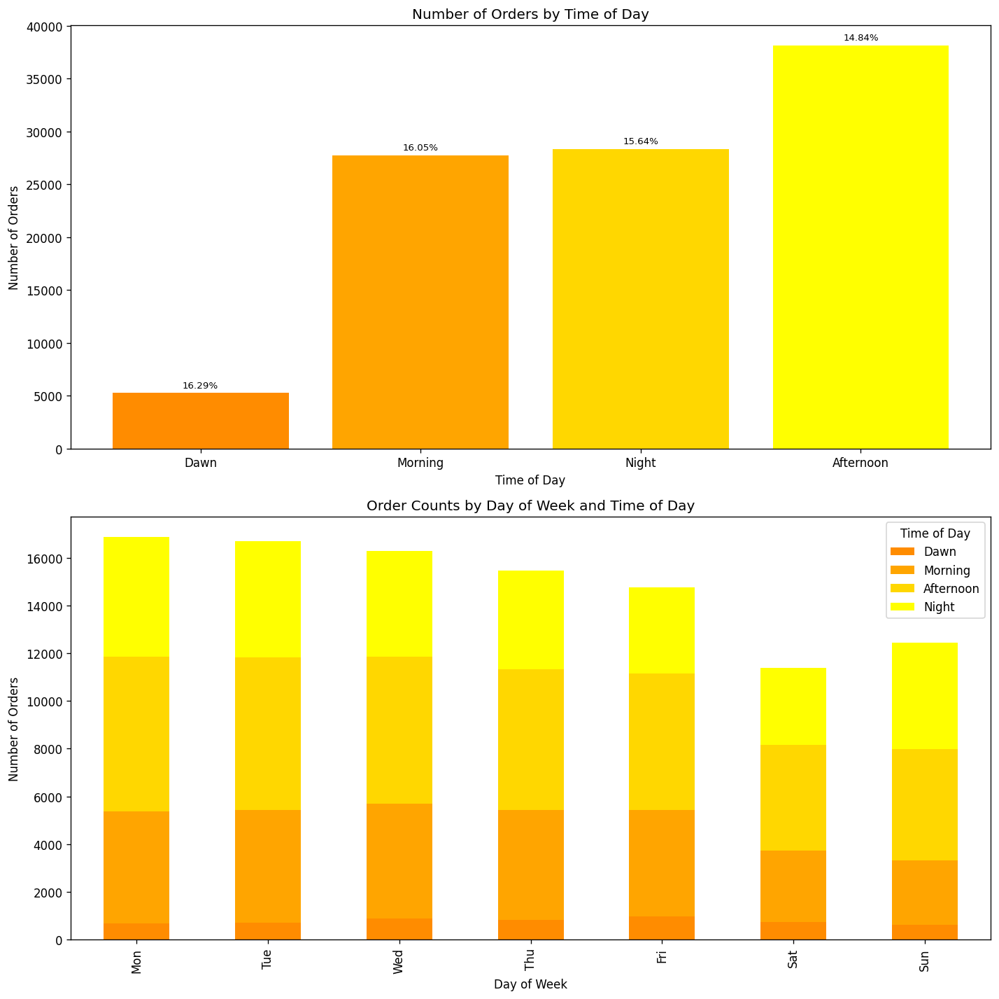

In [103]:
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["figure.figsize"] = (6,5)
plt.rcParams["figure.dpi"] = 120

fig, axes = plt.subplots(2, 1, figsize=(12, 12))

colors = ['darkorange', 'orange', 'gold', 'yellow']
bars = axes[0].bar(order_time_day.index, order_time_day['n_orders'], color=colors)

for bar, value, percentage in zip(bars, order_time_day['n_orders'], percentages):
    yval = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2, yval + 300, f"{percentage}", ha='center', va='bottom', fontsize=8)

axes[0].set_ylabel('Number of Orders')
axes[0].set_xlabel('Time of Day')
axes[0].set_title('Number of Orders by Time of Day')

order_day_time.plot(kind='bar', stacked=True, color=colors, ax=axes[1])
axes[1].set_xlabel('Day of Week')
axes[1].set_ylabel('Number of Orders')
axes[1].legend(title='Time of Day')
axes[1].set_title('Order Counts by Day of Week and Time of Day')

plt.tight_layout()
plt.show()

### Chi-square 

In [104]:
from scipy.stats import chi2_contingency

chi2, p, dof, expected = chi2_contingency(order_day_time)

chi2, p, dof, expected

(759.0836042717932,
 1.6027765577666482e-149,
 18,
 array([[ 894.38182238, 4702.57060624, 6447.31364188, 4830.7339295 ],
        [ 884.84174961, 4652.40985311, 6378.54229636, 4779.20610092],
        [ 862.5285794 , 4535.08942495, 6217.69376047, 4658.68823518],
        [ 819.91625436, 4311.03806095, 5910.51508384, 4428.53060085],
        [ 782.70997054, 4115.41112373, 5642.30683634, 4227.57206938],
        [ 603.09160041, 3170.99561057, 4347.49522554, 3257.41756348],
        [ 658.53002329, 3462.48532045, 4747.13315557, 3556.85150068]]))

The P-value << 0.05, which indicates rejection of the null hypothesis that there is sufficient evidence that there is a significant association between the four time periods of the day and the purchasing power of the seven days of the week.

## V.3. Comparative Analysis

## V.4. Multivariate Analysis